In [82]:
import os
import mido
import numpy as np
import math
from scipy.stats import f_oneway
from statsmodels.stats.multicomp import pairwise_tukeyhsd
from statsmodels.stats.multicomp import MultiComparison
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import pearsonr
import pickle
import json

In [2]:
GMD_path = "magenta midi"

## MIDI map to note numbers

In [3]:
GM_dict = {
    # key is midi note number
    # values are:
    # [0] name (as string)
    # [1] name category low mid or high (as string)
    # [2] substiture midi number for simplified MIDI (all instruments)
    # [3] name of instrument for 8 note conversion (as string)
    # [4] number of instrument for 8 note conversion
    # [5] substiture midi number for conversion to 8 note
    # [6] substiture midi number for conversion to 16 note
    # [7] substiture midi number for conversion to 3 note
    # if we are going to remap just use GM_dict[msg.note][X]
    22: ["Closed Hi-Hat edge", "high", 42, "CH", 3, 42, 42, 42],
    26: ["Open Hi-Hat edge", "high", 46, "OH", 4, 46, 46, 42],
    35: ["Acoustic Bass Drum", "low", 36, "K", 1, 36, 36, 36],
    36: ["Bass Drum 1", "low", 36, "K", 1, 36, 36, 36],
    37: ["Side Stick", "mid", 37, "RS", 6, 37, 37, 38],
    38: ["Acoustic Snare", "mid", 38, "SN", 2, 38, 38, 38],
    39: ["Hand Clap", "mid", 39, "CP", 5, 39, 39, 38],
    40: ["Electric Snare", "mid", 38, "SN", 2, 38, 38, 38],
    41: ["Low Floor Tom", "low", 45, "LT", 7, 45, 45, 36],
    42: ["Closed Hi Hat", "high", 42, "CH", 3, 42, 42, 42],
    43: ["High Floor Tom", "mid", 45, "HT", 8, 45, 45, 38],
    44: ["Pedal Hi-Hat", "high", 46, "OH", 4, 46, 46, 42],
    45: ["Low Tom", "low", 45, "LT", 7, 45, 45, 36],
    46: ["Open Hi-Hat", "high", 46, "OH", 4, 46, 46, 42],
    47: ["Low-Mid Tom", "low", 47, "MT", 7, 45, 47, 36],
    48: ["Hi-Mid Tom", "mid", 47, "MT", 7, 50, 50, 38],
    49: ["Crash Cymbal 1", "high", 49, "CC", 4, 46, 42, 42],
    50: ["High Tom", "mid", 50, "HT", 8, 50, 50, 38],
    51: ["Ride Cymbal 1", "high", 51, "RC", -1, 42, 51, 42],
    52: ["Chinese Cymbal", "high", 52, "", -1, 46, 51, 42],
    53: ["Ride Bell", "high", 53, "", -1, 42, 51, 42],
    54: ["Tambourine", "high", 54, "", -1, 42, 69, 42],
    55: ["Splash Cymbal", "high", 55, "OH", 4, 46, 42, 42],
    56: ["Cowbell", "high", 56, "CB", -1, 37, 56, 42],
    57: ["Crash Cymbal 2", "high", 57, "CC", 4, 46, 42, 42],
    58: ["Vibraslap", "mid", 58, "VS", 6, 37, 37, 42],
    59: ["Ride Cymbal 2", "high", 59, "RC", 3, 42, 51, 42],
    60: ["Hi Bongo", "high", 60, "LB", 8, 45, 63, 42],
    61: ["Low Bongo", "mid", 61, "HB", 7, 45, 64, 38],
    62: ["Mute Hi Conga", "mid", 62, "MC", 8, 50, 62, 38],
    63: ["Open Hi Conga", "high", 63, "HC", 8, 50, 63, 42],
    64: ["Low Conga", "low", 64, "LC", 7, 45, 64, 36],
    65: ["High Timbale", "mid", 65, "", 8, 45, 63, 38],
    66: ["Low Timbale", "low", 66, "", 7, 45, 64, 36],
    67: ["High Agogo", "high", 67, "", -1, 37, 56, 42],
    68: ["Low Agogo", "mid", 68, "", -1, 37, 56, 38],
    69: ["Cabasa", "high", 69, "MA", -1, 42, 69, 42],
    70: ["Maracas", "high", 69, "MA", -1, 42, 69, 42],
    71: ["Short Whistle", "high", 71, "", -1, 37, 56, 42],
    72: ["Long Whistle", "high", 72, "", -1, 37, 56, 42],
    73: ["Short Guiro", "high", 73, "", -1, 42, 42, 42],
    74: ["Long Guiro", "high", 74, "", -1, 46, 46, 42],
    75: ["Claves", "high", 75, "", -1, 37, 75, 42],
    76: ["Hi Wood Block", "high", 76, "", 8, 50, 63, 42],
    77: ["Low Wood Block", "mid", 77, "", 7, 45, 64, 38],
    78: ["Mute Cuica", "high", 78, "", -1, 50, 62, 42],
    79: ["Open Cuica", "high", 79, "", -1, 45, 63, 42],
    80: ["Mute Triangle", "high", 80, "", -1, 37, 75, 42],
    81: ["Open Triangle", "high", 81, "", -1, 37, 75, 42],
}

## MIDI parser to ```hv_list ``` representation



In [4]:
def midifile2hv_list(file_name, mapping):
    '''
    pattern name must include .mid
    get a MIDI file and convert it to an hv_list (a list of note numbers and velocity)
    use the "mapping" variable to define the type of instrument mapping
    that will be used in the hv_list "all", "16", "8", "3"
    '''
    pattern=[]
    mid=mido.MidiFile(file_name) #create a mido file instance
    sixteenth= mid.ticks_per_beat/4 #find the length of a sixteenth note
    #print ("sixteenth", sixteenth)

    # time: inside a track, it is delta time in ticks (integrer).
    # A delta time is how long to wait before the next message.
    acc=0 #use this to keep track of time

    # depending on the instruments variable select a notemapping
    if mapping=="allinstruments":
        column=2
    elif mapping=="16instruments":
        column=6
    elif mapping=="8instruments":
        column=5
    elif mapping=="3instruments":
        column=7
    else: column = 2 # if no mapping is selected use "allinstrument" mapping

    for i, track in enumerate(mid.tracks):
        for msg in track: #process all messages
            acc += msg.time # accumulate time of any message type
            if msg.type == "note_on" and msg.velocity != 0: # skip velocity 0 format of note off
                if msg.note in list(GM_dict.keys()):
                  midinote = GM_dict[msg.note][column] #remap msg.note by demand
                  rounded_step = int((acc/sixteenth)+0.45)
                  midivelocity = msg.velocity/127 # normalize upfront
                  pattern.append((int(acc/sixteenth), midinote, midivelocity)) # step, note, velocity

        if len(pattern)>0: #just proceed if analyzed pattern has at least one onset

            #round the pattern to the next multiple of 16
            if (rounded_step/16) - (rounded_step//16) != 0:
                pattern_len_in_steps = (rounded_step//16)*16 + 16
            else:
                pattern_len_in_steps = (rounded_step//16)*16

            #create an empty list of lists the size of the pattern
            output_pattern=[[]]*pattern_len_in_steps
            # group the instruments and their velocity that played at a specific step
            i = 0
            for step in range(len(output_pattern)):
                output_pattern.append([(x[1],x[2]) for x in pattern if x[0]==step])
                #make sure no notes are repeated and events are sorted
                output_pattern[step] = list(set(output_pattern[step]))
                output_pattern[step].sort()

    ##################################
    # split the pattern every 16 steps
    ##################################
    hv_lists_split=[]
    for x in range(len(output_pattern)//16):
        patt_fragment = output_pattern[x*16:(x*16)+16]
        patt_density = sum([1 for x in patt_fragment if x!=[]])

        #############################################################
        # filter out patterns that have less than 4 events with notes
        #############################################################
        # NOTE: more conditions could be added (i.e. kick on step 0, etc)
        #############################################################
        if patt_density > 4:
            hv_lists_split.append(patt_fragment)

  # output is a 16-step pattern
    return hv_lists_split

def find_unique_hv_lists(hv_lists_split):
  # input a list of hv_lists and return the set of unique
  unique_hv = list(set([tuple([tuple(step) for step in hv_list]) for hv_list in hv_lists]))
  return unique_hv

## Flatten an `hv_list` to `FWOD` representation

In [5]:
# hv list flattening
def flatten_hv_list(hv_list):
  # input an hv list and output a flattened representation as a v_list

  # list of instruments and categories
  lows =  [35, 36, 41, 45, 47, 64, 66]
  mids =  [37, 38, 39, 40, 43, 48, 50, 61, 62, 65, 68, 77]
  his = [22, 26, 42, 44, 46, 49, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 63, 67, 69, 70, 71, 72, 73, 74, 75, 76, 78, 79, 80, 81]

  flat = np.zeros([len(hv_list),1])

  # multiply velocities and categories
  for i,step in enumerate(hv_list):
    step_weight = 0
    for onset in step:
      if onset[0] in lows:
        step_weight += onset[1]*3
      elif onset[0] in mids:
        step_weight += onset[1]*2
      else:
        step_weight += onset[1]*1
    flat[i] = step_weight

  flat = flat/max(flat)
  return flat

# Data creation

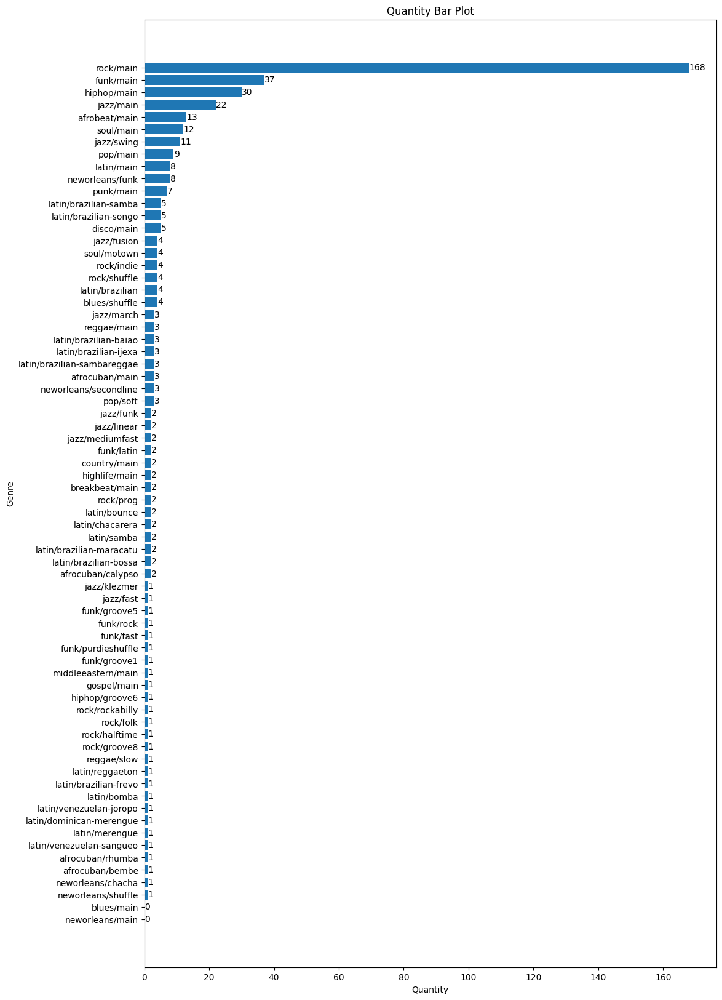

In [92]:
def list_folders(directory):
    return [name for name in os.listdir(directory) if os.path.isdir(os.path.join(directory, name))]

def filter_midi(list): 
    return [x for x in list if x.endswith(".mid")]

# def list_all_elements(directory):
#     elements = []
#     for root, dirs, files in os.walk(directory):
#         for name in dirs:
#             elements.append(os.path.join(root, name))
#         for name in files:
#             elements.append(os.path.join(root, name))
#     return filter_midi(elements)

def list_all_elements(directory):
    elements = {}
    main_class = directory.split('/')[-1]
    for root, dirs, files in os.walk(directory):
        class_name = root.split(directory)[1].replace('/', '')
        class_key = f'{main_class}/{class_name}' if  class_name != '' else f'{main_class}/main'
        elements[class_key] = filter_midi(files)
    return elements

# Example usage
directory_path_magenta = 'magenta midi'
folders = list_folders(directory_path_magenta)

# list_all_elements('magenta midi/jazz')

# all_midi_files = {}
all_genre_files = {}
for genre in folders:
    current_elements = list_all_elements(f"{directory_path_magenta}/{genre}")
    all_genre_files.update(current_elements)
    # list_all_elements[genre] = list_all_elements(f"{directory_path_magenta}/{genre}")

# total = 0
# quantity = {}
# for key, value in all_midi_files.items():
#     # print(key, len(value))
#     quantity[key] = len(value)
#     total += len(value)
# # print("Total:", total)
# quantity

data_count = {genre: len(files) for genre, files in all_genre_files.items()}
sorted_items = sorted(data_count.items(), key=lambda item: item[1])
keys, values = zip(*sorted_items)


plt.figure(figsize=(12, 20))
bars = plt.barh(keys, values)

for bar, value in zip(bars, values):
    plt.text(bar.get_width() + 0.1, bar.get_y() + bar.get_height() / 2, str(value), va='center')

plt.title('Quantity Bar Plot')
plt.xlabel('Quantity')
plt.ylabel('Genre')

# Show plot
plt.show()

In [93]:

# for key, value in all_midi_files.items():
# 	print(key)
# 	for midi in value:
# 		print(midi)
		
# 	print('='*50)

In [119]:
midi_genre_elements = {}
for key, value in all_genre_files.items(): 
	for midi in value:
		genre = key.split('/')[0]
		sub_genre = key.split('/')[1]
		midi_path = f"{directory_path_magenta}/{genre}/{midi}" if sub_genre == 'main' else f"{directory_path_magenta}/{genre}/{sub_genre}/{midi}"
		# print(midi_path)
		hv_lists = midifile2hv_list(midi_path, "allinstruments")
		# print(midi_path, '-'*10, len(hv_lists))
		key_genre = key if 'groove' not in key else f'{genre}/groove'
		# print(key_genre)
		midi_genre_elements[key_genre] = len(hv_lists) if key_genre not in midi_genre_elements else midi_genre_elements[key_genre] + len(hv_lists)
		# for pattern in range(len(hv_lists)):
		# 	fwod = flatten_hv_list(hv_lists[pattern])
		# 	print(hv_lists[pattern])
		# 	element = {'file': midi, 'sequence': pattern, 'class': key}
		# 	for i in range(len(fwod)):
		# 		element[f'step_{i}'] = fwod[i][0]

			# fwod_representations.append(element)
	print('='*50, key)
print(midi_genre_elements)

================================================== pop/main
================================================== pop/soft
================================================== neworleans/main
================================================== neworleans/shuffle
================================================== neworleans/chacha
================================================== neworleans/secondline
================================================== neworleans/funk
================================================== disco/main
================================================== blues/main
================================================== blues/shuffle
================================================== afrocuban/main
================================================== afrocuban/bembe
================================================== afrocuban/rhumba
================================================== afrocuban/calypso
================================================== latin/main
=============

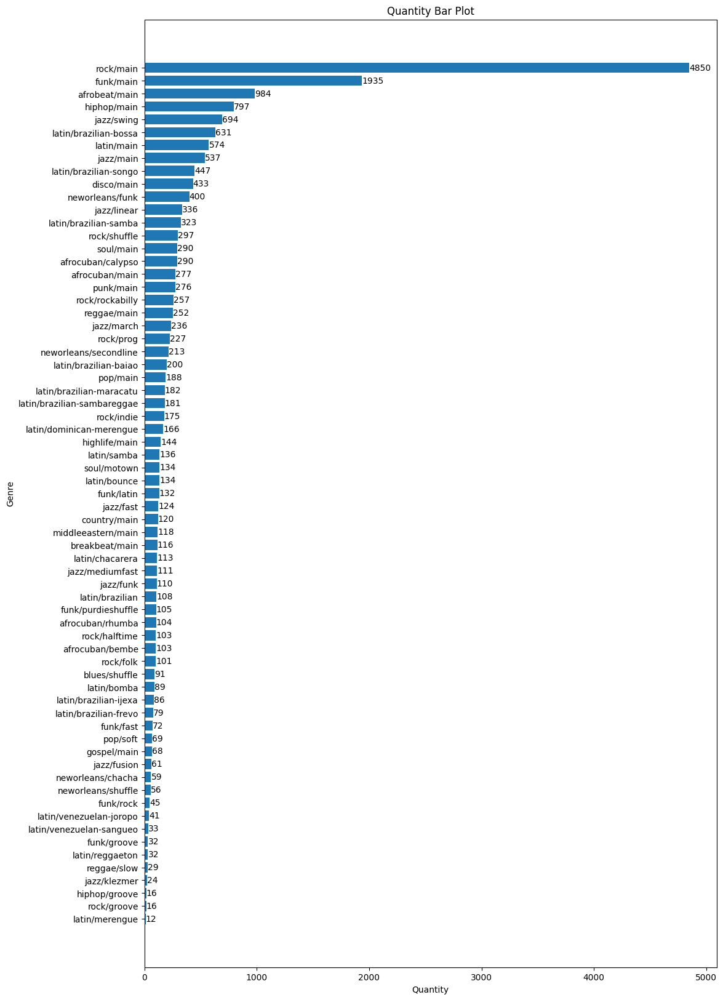

In [ ]:
data_count = midi_genre_elements
sorted_items = sorted(data_count.items(), key=lambda item: item[1])
keys, values = zip(*sorted_items)


plt.figure(figsize=(12, 20))
bars = plt.barh(keys, values)

for bar, value in zip(bars, values):
    plt.text(bar.get_width() + 0.1, bar.get_y() + bar.get_height() / 2, str(value), va='center')

plt.title('Quantity Bar Plot')
plt.xlabel('Quantity')
plt.ylabel('Genre')

# Show plot
plt.show()

In [123]:
len(keys)

67

In [29]:
fwod_representations = []
for key, value in all_midi_files.items():
	for midi in value:
		hv_lists = midifile2hv_list(midi, "allinstruments")
		# print(len(hv_lists)) ---> son arreglos que contiene 16 pasos
		for pattern in range(len(hv_lists)):
			fwod = flatten_hv_list(hv_lists[pattern])
			print(hv_lists[pattern])
			element = {'file': midi, 'sequence': pattern, 'class': key}
			for i in range(len(fwod)):
				element[f'step_{i}'] = fwod[i][0]
			fwod_representations.append(element)
fwod_representations

[[], [], [], [(42, 0.09448818897637795)], [], [], [], [(36, 0.3779527559055118), (42, 0.6299212598425197)], [(38, 0.15748031496062992)], [(42, 0.12598425196850394)], [], [(42, 0.7559055118110236)], [], [(42, 0.10236220472440945)], [], []]
[[(42, 0.8976377952755905)], [(42, 0.1889763779527559)], [], [], [(42, 1.0)], [(42, 0.13385826771653545)], [], [(42, 1.0)], [], [(42, 0.2125984251968504)], [], [(42, 1.0)], [], [(42, 0.25984251968503935)], [], [(42, 1.0)]]
[[], [(38, 0.3543307086614173), (42, 0.4251968503937008)], [], [(38, 1.0), (46, 1.0)], [], [], [], [(46, 0.47244094488188976)], [(36, 0.5590551181102362), (42, 1.0)], [(42, 0.14960629921259844)], [], [(38, 0.8346456692913385), (42, 1.0)], [], [(42, 0.2047244094488189)], [], [(36, 0.4409448818897638), (42, 1.0)]]
[[], [(42, 0.16535433070866143), (36, 0.4251968503937008)], [], [(38, 1.0), (42, 1.0)], [], [(36, 0.3937007874015748)], [], [(42, 1.0)], [], [(38, 0.13385826771653545), (36, 0.36220472440944884), (42, 0.09448818897637795)], 

[{'file': 'magenta midi/pop/105_pop_132_beat_4-4.mid',
  'sequence': 0,
  'class': 'pop',
  'step_0': 0.0,
  'step_1': 0.0,
  'step_2': 0.0,
  'step_3': 0.05357142857142857,
  'step_4': 0.0,
  'step_5': 0.0,
  'step_6': 0.0,
  'step_7': 1.0,
  'step_8': 0.17857142857142858,
  'step_9': 0.07142857142857142,
  'step_10': 0.0,
  'step_11': 0.42857142857142855,
  'step_12': 0.0,
  'step_13': 0.05803571428571429,
  'step_14': 0.0,
  'step_15': 0.0},
 {'file': 'magenta midi/pop/105_pop_132_beat_4-4.mid',
  'sequence': 1,
  'class': 'pop',
  'step_0': 0.8976377952755905,
  'step_1': 0.1889763779527559,
  'step_2': 0.0,
  'step_3': 0.0,
  'step_4': 1.0,
  'step_5': 0.13385826771653545,
  'step_6': 0.0,
  'step_7': 1.0,
  'step_8': 0.0,
  'step_9': 0.2125984251968504,
  'step_10': 0.0,
  'step_11': 1.0,
  'step_12': 0.0,
  'step_13': 0.25984251968503935,
  'step_14': 0.0,
  'step_15': 1.0},
 {'file': 'magenta midi/pop/105_pop_132_beat_4-4.mid',
  'sequence': 2,
  'class': 'pop',
  'step_0': 0.0

In [30]:
fwod_representations_df = pd.DataFrame(fwod_representations)

# Display the DataFrame
fwod_representations_df

,file,sequence,class,step_0,step_1,step_2,step_3,step_4,step_5,step_6,step_7,step_8,step_9,step_10,step_11,step_12,step_13,step_14,step_15
0,magenta midi/pop/105_pop_132_beat_4-4.mid,0,pop,0.000000,0.000000,0.000000,0.053571,0.000000,0.000000,0.000000,1.000000,0.178571,0.071429,0.000000,0.428571,0.000000,0.058036,0.000000,0.000000
1,magenta midi/pop/105_pop_132_beat_4-4.mid,1,pop,0.897638,0.188976,0.000000,0.000000,1.000000,0.133858,0.000000,1.000000,0.000000,0.212598,0.000000,1.000000,0.000000,0.259843,0.000000,1.000000
2,magenta midi/pop/105_pop_132_beat_4-4.mid,2,pop,0.000000,0.377953,0.000000,1.000000,0.000000,0.000000,0.000000,0.157480,0.892388,0.049869,0.000000,0.889764,0.000000,0.068241,0.000000,0.774278
3,magenta midi/pop/105_pop_132_beat_4-4.mid,3,pop,0.000000,0.480315,0.000000,1.000000,0.000000,0.393701,0.000000,0.333333,0.000000,0.482940,0.000000,1.000000,0.000000,0.041995,0.000000,0.703412
4,magenta midi/pop/105_pop_132_beat_4-4.mid,4,pop,0.094488,0.433071,0.000000,1.000000,0.000000,0.000000,0.377953,0.299213,0.000000,0.419948,0.000000,0.666667,0.314961,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19769,magenta midi/jazz/funk/4_jazz-funk_116_beat_4-...,32,jazz,0.584830,0.668663,0.287425,0.059880,0.702595,1.000000,0.147705,0.622754,0.119760,0.604790,0.000000,0.481038,0.327345,0.510978,0.215569,0.433134
19770,magenta midi/jazz/funk/4_jazz-funk_116_beat_4-...,33,jazz,0.083650,0.692015,0.692015,0.904943,0.266160,0.714829,0.737643,0.486692,0.463878,0.798479,0.536122,0.882129,0.585551,0.832700,1.000000,0.524715
19771,magenta midi/jazz/funk/4_jazz-funk_116_beat_4-...,34,jazz,0.258427,0.561798,0.387640,0.730337,0.000000,1.000000,0.140449,0.500000,0.148876,0.629213,0.311798,0.626404,0.154494,0.603933,0.337079,0.587079
19772,magenta midi/jazz/funk/4_jazz-funk_116_beat_4-...,35,jazz,0.323129,0.778912,0.448980,0.894558,0.187075,0.772109,0.217687,0.948980,0.000000,1.000000,0.418367,0.833333,0.183673,0.721088,0.163265,0.323129


{'pop/main': ['105_pop_132_beat_4-4.mid',
  '100_pop_142_beat_4-4.mid',
  '104_pop_132_beat_4-4.mid',
  '7_pop-groove7_138_beat_4-4.mid',
  '101_pop_142_beat_4-4.mid',
  '97_pop_142_beat_4-4.mid',
  '102_pop_132_beat_4-4.mid',
  '103_pop_132_beat_4-4.mid',
  '96_pop_142_beat_4-4.mid'],
 'pop/soft': ['22_pop-soft_83_beat_4-4.mid',
  '11_pop-soft_83_beat_4-4.mid',
  '23_pop-soft_83_beat_4-4.mid'],
 'neworleans/main': [],
 'neworleans/shuffle': ['9_neworleans-shuffle_104_beat_4-4.mid'],
 'neworleans/chacha': ['8_neworleans-chacha_124_beat_4-4.mid'],
 'neworleans/secondline': ['6_neworleans-secondline_99_beat_4-4.mid',
  '100_neworleans-secondline_94_beat_4-4.mid',
  '7_neworleans-secondline_124_beat_4-4.mid'],
 'neworleans/funk': ['11_neworleans-funk_82_beat_4-4.mid',
  '19_neworleans-funk_90_beat_4-4.mid',
  '10_neworleans-funk_102_beat_4-4.mid',
  '10_neworleans-funk_82_beat_4-4.mid',
  '67_neworleans-funk_93_beat_4-4.mid',
  '82_neworleans-funk_84_beat_4-4.mid',
  '91_neworleans-funk_9

In [ ]:
# fwod_representations_df into excel
# fwod_representations_df.to_excel('fwod_representations_base.xlsx', index=False)

ValueError: setting an array element with a sequence. The requested array has an inhomogeneous shape after 1 dimensions. The detected shape was (70,) + inhomogeneous part.

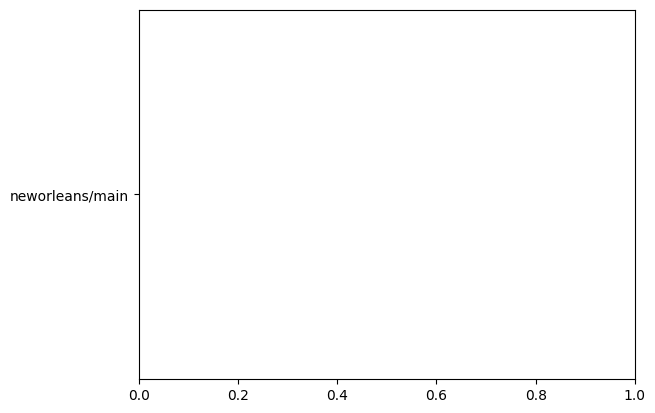

In [ ]:
data_count = fwod_representations_df['class'].value_counts().to_dict()
sorted_items = sorted(data_count.items(), key=lambda item: item[1], )
keys, values = zip(*sorted_items)

# Create horizontal bar plot
plt.barh(keys, values)

# Add title and labels
plt.title('Quantity Bar Plot')
plt.xlabel('Quantity')
plt.ylabel('Category')

# Show plot
plt.show()

In [33]:
dataset = pd.read_excel('fwod_representations_base.xlsx')

In [55]:
# tghe 80% of the minor class
reference_value = round(dataset[dataset['class'] == 'gospel']['class'].value_counts().to_numpy()[0] * 0.8)
reference_value

54

In [51]:
all_classes = list(dataset['class'].unique())

In [52]:
def balance_data(dataset, target_classes, sample_size):
    """
    Balances the dataset to include only specific target classes, each with a fixed sample size.
    
    Args:
        dataset (pd.DataFrame): The original dataset with a 'class' column.
        target_classes (list): List of classes to include in the balanced dataset.
        sample_size (int): The number of samples to include per class.
    
    Returns:
        pd.DataFrame: A balanced dataset.
    """
    balanced_data = pd.DataFrame()

    for target_class in target_classes:
        # Filter rows for the current class
        class_data = dataset[dataset['class'] == target_class]
        # Keep only the first `sample_size` rows
        balanced_data = pd.concat([balanced_data, class_data.head(sample_size)])
    
    return balanced_data.reset_index(drop=True)

# Define parameters
# target_classes = [
#     'rock', 'latin', 'funk', 'jazz', 'afrobeat', 
#     'afrocuban', 'hiphop', 'neworleans', 'dance', 'soul'
# ]
sample_size = reference_value

# Apply the function to the dataset
balanced_dataset = balance_data(dataset, all_classes, sample_size)


In [53]:
data_count = balanced_dataset['class'].value_counts().to_dict()
data_count

{'pop': 54,
 'punk': 54,
 'funk': 54,
 'country': 54,
 'middleeastern': 54,
 'soul': 54,
 'highlife': 54,
 'breakbeat': 54,
 'gospel': 54,
 'hiphop': 54,
 'neworleans': 54,
 'rock': 54,
 'afrobeat': 54,
 'reggae': 54,
 'latin': 54,
 'afrocuban': 54,
 'blues': 54,
 'disco': 54,
 'jazz': 54}

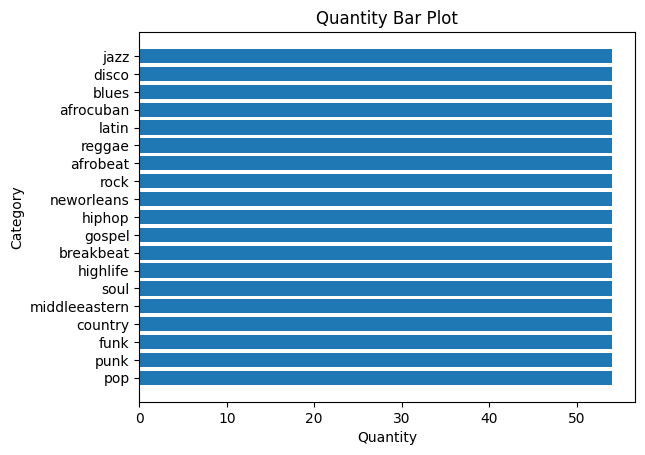

In [54]:
sorted_items = sorted(data_count.items(), key=lambda item: item[1], )
keys, values = zip(*sorted_items)

# Create horizontal bar plot
plt.barh(keys, values)

# Add title and labels
plt.title('Quantity Bar Plot')
plt.xlabel('Quantity')
plt.ylabel('Category')

# Show plot
plt.show()

In [56]:
balanced_dataset.to_excel('balanced_all_data_1_bar.xlsx', index=False)